# Dermnet - Kamień milowy 2 (Feature engineering)
### 0. Pakiety

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import cv2

#%pip install tensorflow
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.cluster import KMeans
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
from datetime import datetime

## 1. Przygotowanie
### 1.1. Import danych

In [2]:
df1 = pd.read_pickle('train_data_1.pkl')
df2 = pd.read_pickle('train_data_2.pkl')
X_train = pd.concat([df1, df2], axis=0)
# X_train = pd.read_pickle('train_data.pkl')

In [3]:
# to check if ok
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15557 entries, 0 to 15556
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   15557 non-null  object
dtypes: object(1)
memory usage: 121.7+ KB


### 1.2. Funkcje do modyfikacji i wizualizacji obrazów

In [4]:
random.seed(2137)
chosen_indexes = random.sample(range(len(X_train['image'])), 8)

def visualize_random_images(df, indexes = [0, 1, 2, 3, 4, 5, 6, 7]):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    for i in range(8):
        img = df['image'].iloc[indexes[i]]
        ax = axes[i//4, i%4]
        ax.imshow(img)
        ax.axis('off')


def convert_to_grayscale(data_frame, colname='image'):
    '''
    Convert the RGB images to grayscale
    '''
    result = []
    k=0
    for image in data_frame['image']:
        r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]
        gray = 0.33 * r + 0.33 * g + 0.33 * b
        result.append(gray)
    result = pd.DataFrame({colname : result})
    return result

def convert_to_grayscale_one_color(data_frame, colname='image'):
    '''
    Convert the RGB images to grayscale
    '''
    result = []
    k=0
    for image in data_frame['image']:
        r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]
        gray = r + g + b
        result.append(gray)
    result = pd.DataFrame({colname : result})
    return result


def visualize_random_images_grey(df, indexes = [0, 1, 2, 3, 4, 5, 6, 7]):
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    for i in range(8):
        img = df['image'].iloc[indexes[i]]
        ax = axes[i//4, i%4]
        ax.imshow(img, cmap='gray')
        ax.axis('off')


def extract_rgb_channel(data_frame, colname='image', color='red'):
    '''
    Convert the RGB images to grayscale
    '''
    if color == 'red':
        channel = 0
    elif color == 'green':
        channel = 1
    elif color == 'blue':
        channel = 2
    result = []
    k=0
    for image in data_frame['image']:
        modified_image = np.zeros_like(image)
        modified_image[:,:,channel] = image[:,:,channel]
        result.append(modified_image)
    result = pd.DataFrame({colname : result})
    return result


def global_threshold(df, tresh, colname = 'image'):
    '''
    Runs threshold on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        result.append((image > tresh) * 255)
    result = pd.DataFrame({colname : result})
    return result

def reverse_threshold(df, tresh, colname = 'image'):
    '''
    Runs threshold on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        result.append((image < tresh) * 255)
    result = pd.DataFrame({colname : result})
    return result

def detect_images(df, low_th = 50, high_th = 150, blur_ksize = 5, colname = 'image'):
    '''
    Runs edge detection on all images in df
    '''
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        image = (image * 255).astype(np.uint8)
        blurred_image = cv2.GaussianBlur(image, (blur_ksize, blur_ksize), 0)

        edges = cv2.Canny(blurred_image, low_th, high_th)  
        result.append(edges)
    result = pd.DataFrame({colname : result})
    return result

def convert_to_negative_image(df, colname = 'image'):
    '''
    Converts the image to negative
    '''
    result = []
    for image in df[colname]:
        result.append(255 - image)
    result = pd.DataFrame({colname : result})
    return result

def erosion(df, kernel_size=(5,5), iterations=1, colname='image'):
    result = []
    kernel = np.ones(kernel_size, np.uint8)
    for image in df[colname]:
        eroded_image = cv2.erode(image, kernel, iterations=iterations)
        result.append(eroded_image)
    result = pd.DataFrame({colname: result})
    return result

def dilation(df, kernel_size=(5,5), iterations=1, colname='image'):
    result = []
    kernel = np.ones(kernel_size, np.uint8)
    for image in df[colname]:
        dilated_image = cv2.dilate(image, kernel, iterations=iterations)
        result.append(dilated_image)
    result = pd.DataFrame({colname: result})
    return result

def reverse_hough_transform(df, threshold=100, colname='image'):
    assert df[colname].iloc[0].ndim == 2, "images must be in greyscale"
    result = []
    for image in df[colname]:
        image = image.astype(np.uint8)  # Convert to CV_8U data type
        edges = cv2.Canny(image, 50, 150, apertureSize=3)
        lines = cv2.HoughLines(edges, 1, np.pi/180, threshold)  # Define 'lines' variable
        if lines is not None:
            for rho, theta in lines[:, 0]:
                a = np.cos(theta)
                b = np.sin(theta)
                x0 = a * rho
                y0 = b * rho
                x1 = int(x0 + 1000 * (-b))
                y1 = int(y0 + 1000 * (a))
                x2 = int(x0 - 1000 * (-b))
                y2 = int(y0 - 1000 * (a))
                cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
        result.append(image)
    result = pd.DataFrame({colname: result})
    return result

## Modyfikacja obrazów

## 2. Grayscale

In [5]:
X_train_grayscale = convert_to_grayscale(X_train)

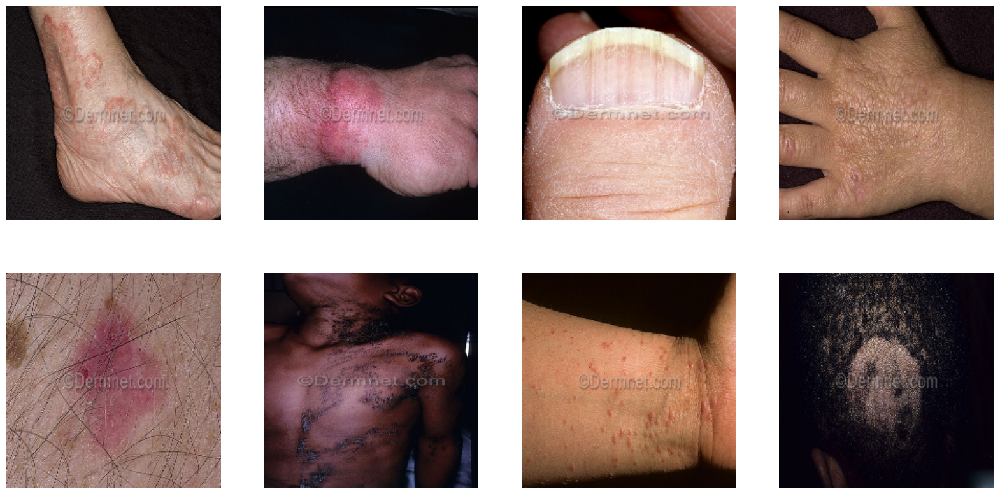

In [8]:
visualize_random_images(X_train, chosen_indexes)

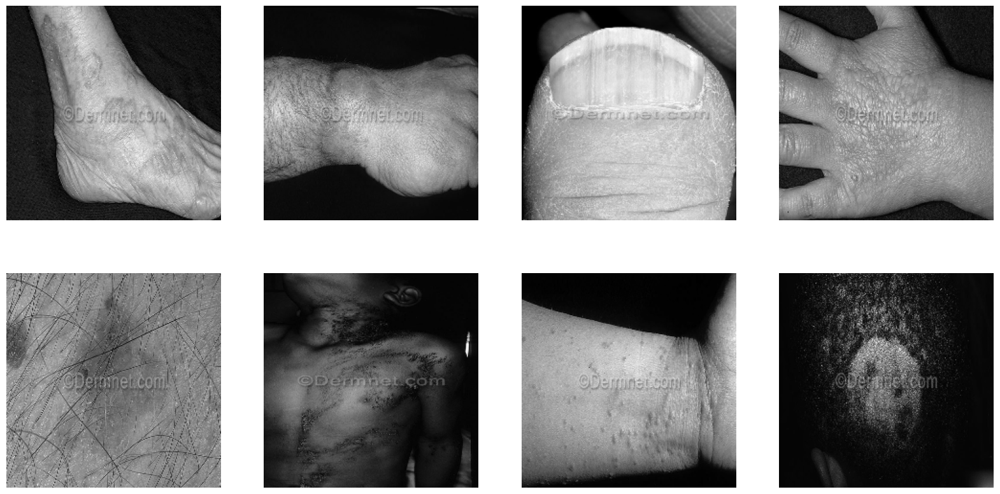

In [9]:
visualize_random_images_grey(X_train_grayscale, chosen_indexes)

## 3. RGB Channels
### 3.1. Red

In [6]:
X_train_red = extract_rgb_channel(X_train, color='red')
X_train_red_gray = convert_to_grayscale_one_color(X_train_red)

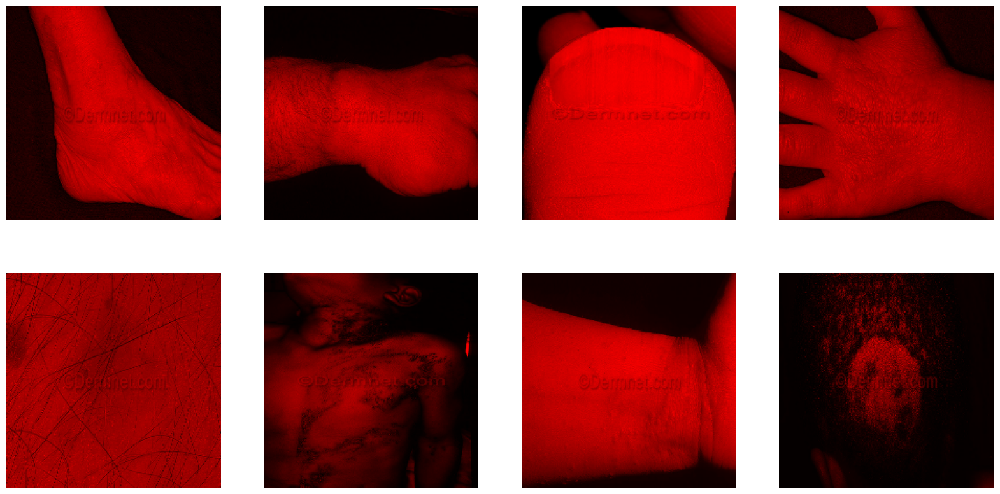

In [11]:
visualize_random_images(X_train_red, chosen_indexes)

### 3.1. Green

In [7]:
X_train_green = extract_rgb_channel(X_train, color='green')
X_train_green_gray = convert_to_grayscale_one_color(X_train_green)

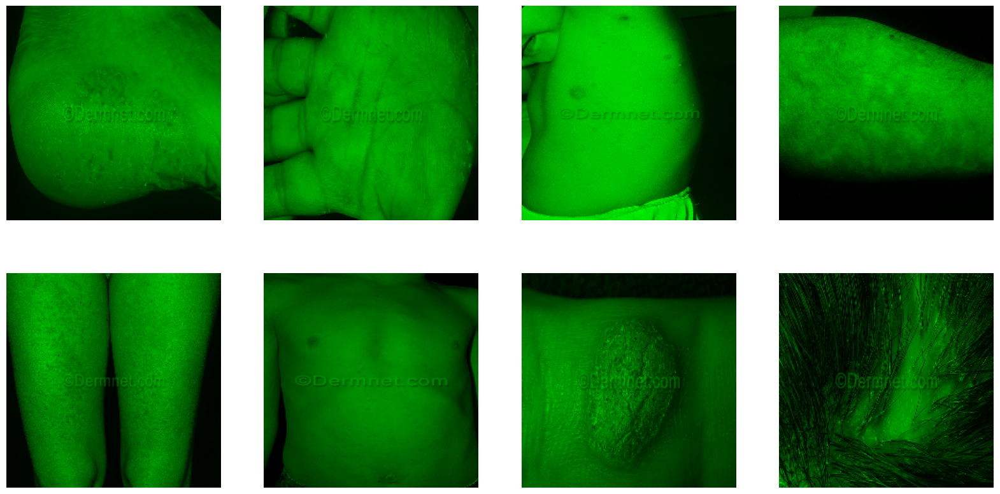

In [10]:
visualize_random_images(X_train_green, chosen_indexes)

### 3.3. Blue

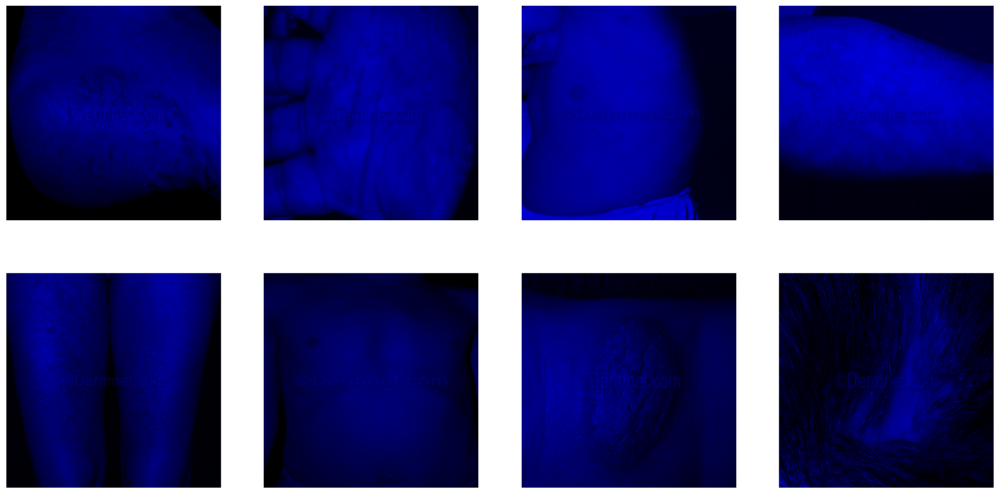

In [8]:
X_train_blue = extract_rgb_channel(X_train, color='blue')
visualize_random_images(X_train_blue, chosen_indexes)

In [9]:
X_train_blue_gray = convert_to_grayscale_one_color(X_train_blue)

## 4. Thresholding
### 4.1. globalny 

thresh = 100

In [8]:
X_train_threshold_100 = global_threshold(X_train_grayscale, 100)

KeyboardInterrupt: 

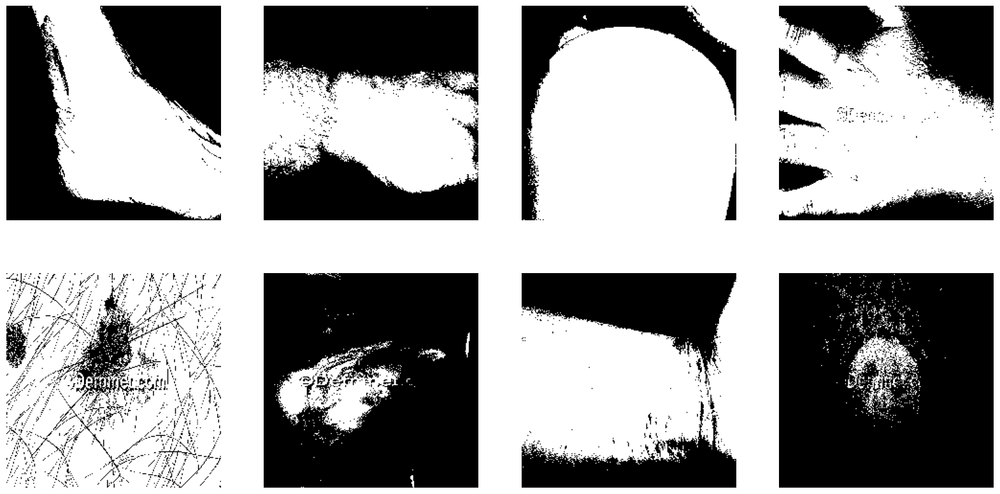

In [16]:
visualize_random_images_grey(X_train_threshold_100, chosen_indexes)

thresh = 150

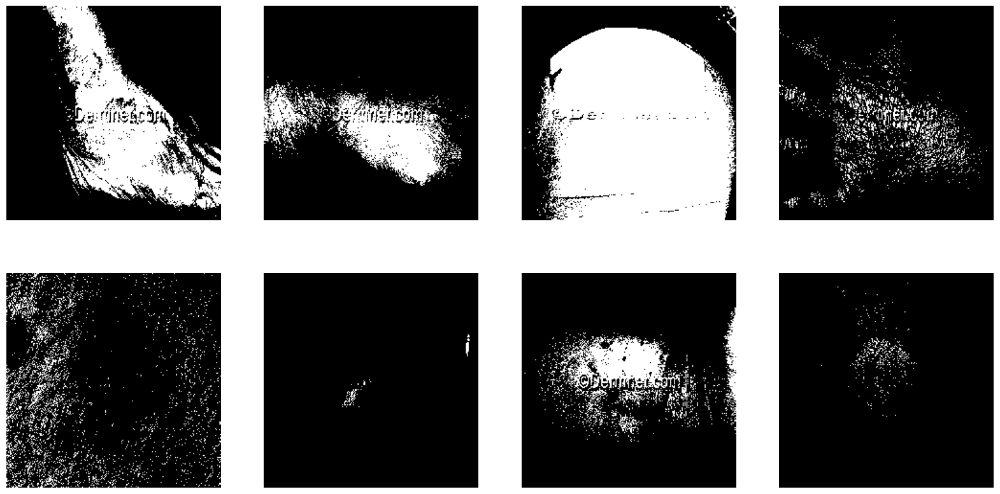

In [ ]:
X_train_threshold_150 = global_threshold(X_train_grayscale, 150)
visualize_random_images_grey(X_train_threshold_150, chosen_indexes)

thresh = 125

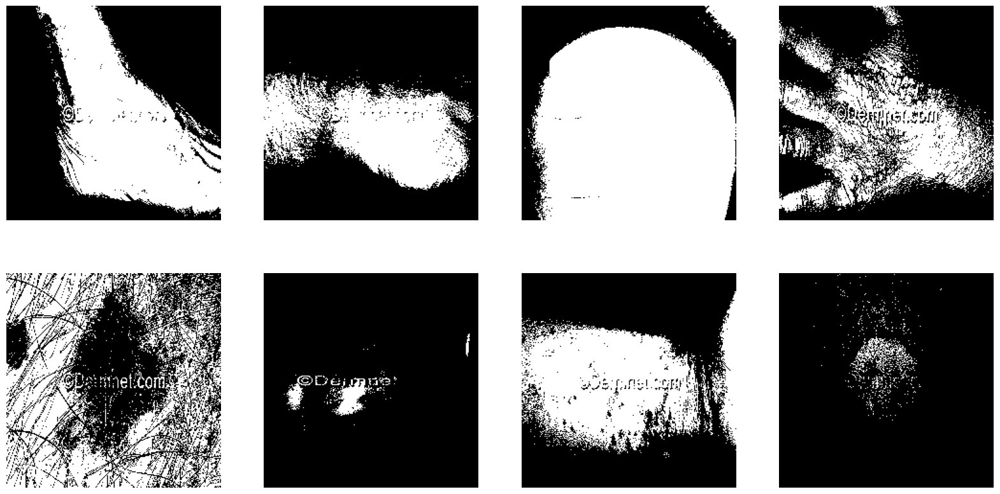

In [ ]:
X_train_threshold_125 = global_threshold(X_train_grayscale, 125)
visualize_random_images_grey(X_train_threshold_125, chosen_indexes)

### 4.2. reverse thresholding

thresh=100 (best)

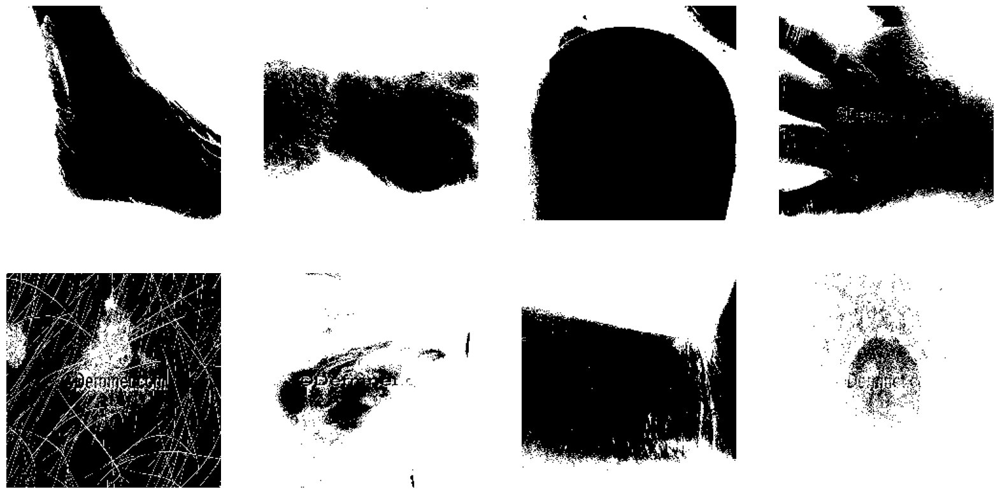

In [ ]:
X_train_rev_threshold_100 = reverse_threshold(X_train_grayscale, 100)
visualize_random_images_grey(X_train_rev_threshold_100, chosen_indexes)

## 5. Edge detection

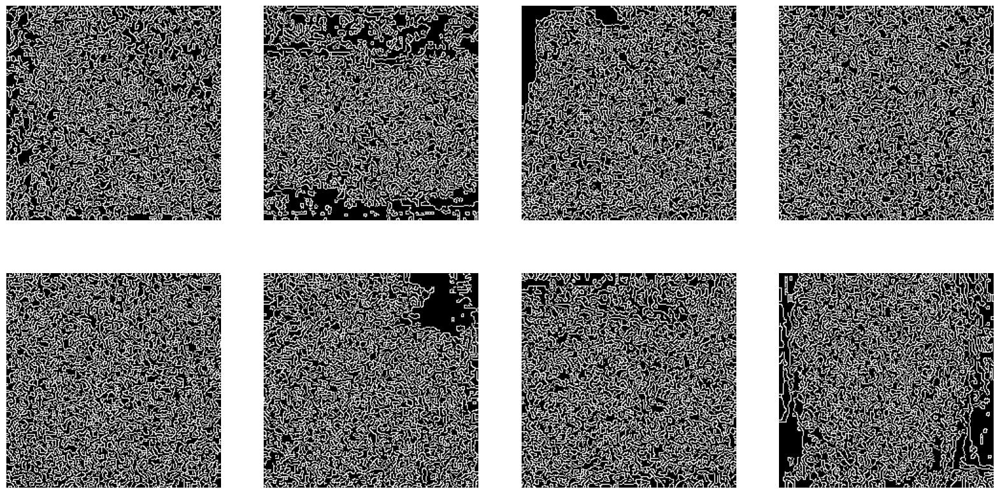

In [ ]:
X_train_edges = detect_images(X_train_grayscale)
visualize_random_images_grey(X_train_edges, chosen_indexes)

## 6. Negative

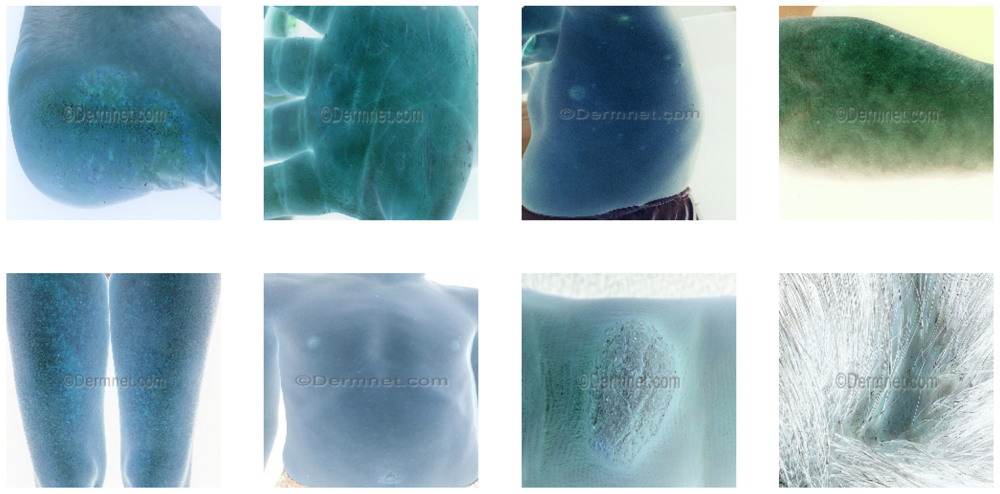

In [10]:
X_train_negative = convert_to_negative_image(X_train)
visualize_random_images(X_train_negative, chosen_indexes)

## 7. Erozja i dylatacja

Erozja - pomniejsza białe obszary na obrazie. Jest to przydatne do usuwania drobnych zakłóceń (szumów) oraz oddzielania obiektów, które są blisko siebie.

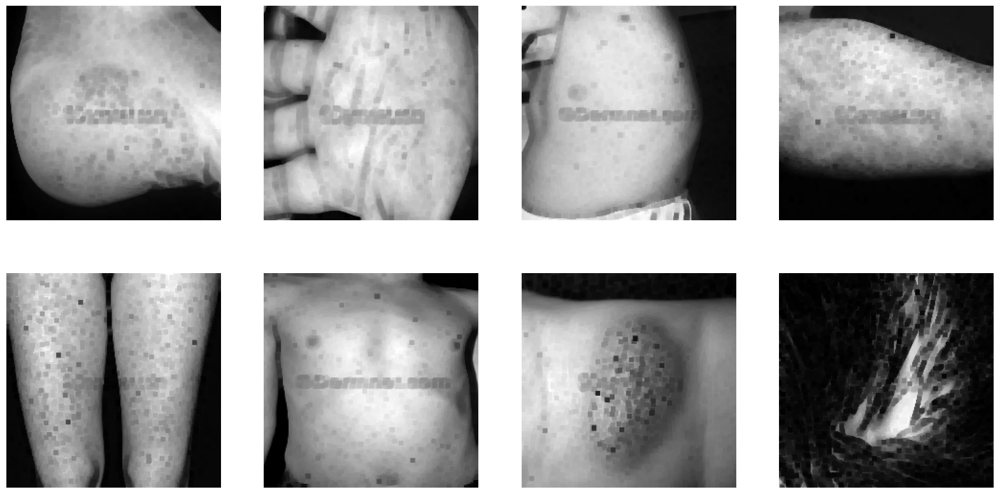

In [11]:
X_train_eroded = erosion(X_train_grayscale)
visualize_random_images_grey(X_train_eroded, chosen_indexes)

Dylatacja - zwiększa białe obszary na obrazie. Jest przydatna do wypełniania luk między obiektami oraz łączenia małych obiektów w większe.

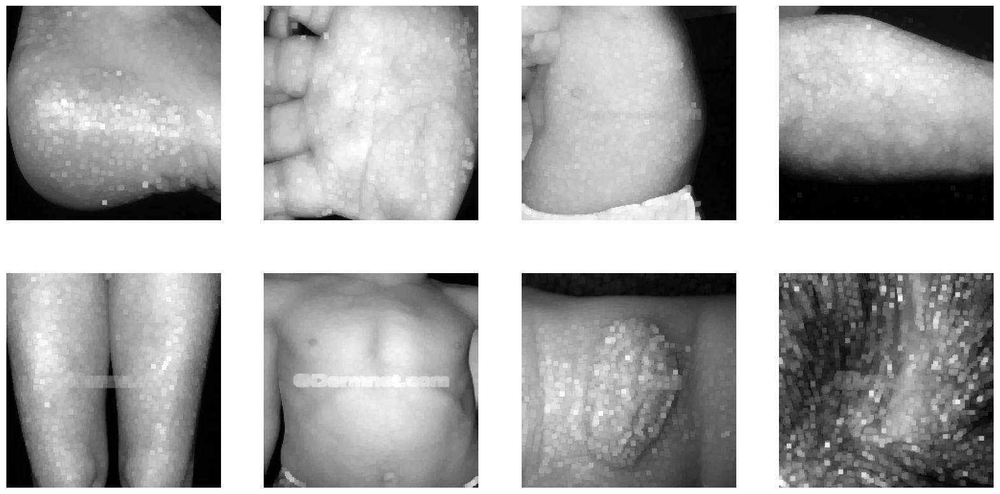

In [12]:
X_train_dilated = dilation(X_train_grayscale)
visualize_random_images_grey(X_train_dilated, chosen_indexes)

## 8. Odwrócona transformacja Hougha

Odwrócona transformacja Hougha - detekcjia prostych linii na obrazach. Transformacja Hougha jest techniką wykrywania kształtów geometrycznych, takich jak linie proste, na obrazie.

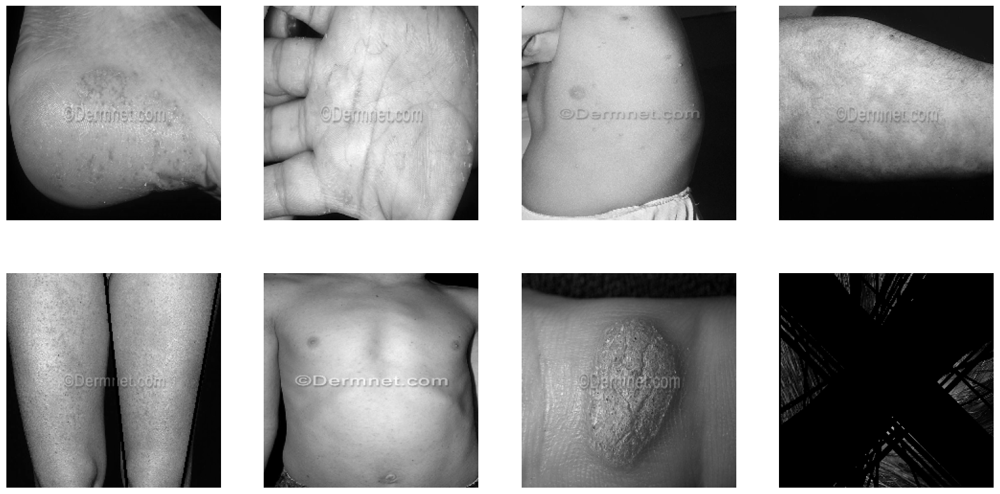

In [13]:
X_train_hough = reverse_hough_transform(X_train_grayscale)
visualize_random_images_grey(X_train_hough, chosen_indexes)

---
## 9. Weryfikacja
### 9.1. Funkcje

In [14]:
def prepare_images_for_clustering_generator(data_frame, colname='image', batch_size=100):
    for start in range(0, len(data_frame), batch_size):
        end = min(start + batch_size, len(data_frame))
        result = []
        for image in data_frame[colname][start:end]:
            img_array = img_to_array(image)
            flat_img_array = img_array.flatten()
            result.append(flat_img_array)
        result = np.array(result)
        flat_images = result / 255.0
        yield flat_images

def incremental_pca_on_batches(data_frame, colname='image', n_components=0.8, batch_size=100):
    # Initialize IncrementalPCA
    ipca = IncrementalPCA(n_components=None, batch_size=batch_size)
    
    # First pass: Fit IPCA to get the explained variance ratio
    for batch in prepare_images_for_clustering_generator(data_frame, colname, batch_size):
        ipca.partial_fit(batch)
    
    explained_variance = np.cumsum(ipca.explained_variance_ratio_)
    num_components = np.argmax(explained_variance >= n_components) + 1
    
    # Second pass: Transform data using the reduced number of components
    ipca = IncrementalPCA(n_components=num_components, batch_size=batch_size)
    X_pca = []
    for batch in prepare_images_for_clustering_generator(data_frame, colname, batch_size):
        X_pca.append(ipca.fit_transform(batch))
    return np.vstack(X_pca)

def count_wcss_scores(data, max_clusters = 10):
    scores = []
    for k in range(1, max_clusters):
        kmeans = KMeans(n_clusters=k, random_state=42, init='k-means++')
        kmeans.fit(data)
        wcss = kmeans.score(data) * -1
        scores.append(wcss)
    return scores

def count_clustering_scores(X, cluster_num, model, score_fun):
    if isinstance(cluster_num, int):
        cluster_num_iter = [cluster_num]
    else:
        cluster_num_iter = cluster_num
        
    scores = []    
    for k in cluster_num_iter:
        model_instance = model(n_clusters=k)
        labels = model_instance.fit_predict(X)
        wcss = score_fun(X, labels)
        scores.append(wcss)
    
    if isinstance(cluster_num, int):
        return scores[0]
    else:
        return scores

def calculate_dunn_index(X, labels):
    unique_cluster_labels = np.unique(labels)
    num_clusters = len(unique_cluster_labels)

    if num_clusters < 2:
        return float('inf')  # Dunn index is not defined for less than 2 clusters

    inter_cluster_distances = []
    intra_cluster_distances = []

    for i in unique_cluster_labels:
        cluster_i = X[labels == i]
        if len(cluster_i) > 1:
            intra_cluster_distances.append(np.max(pairwise_distances(cluster_i)))

        for j in unique_cluster_labels:
            if i < j:
                cluster_j = X[labels == j]
                if len(cluster_j) > 0:
                    inter_cluster_distances.append(np.min(pairwise_distances(cluster_i, cluster_j)))

    if not inter_cluster_distances or not intra_cluster_distances:
        return float('inf')  # Handle cases where distances could not be computed

    return np.min(inter_cluster_distances) / np.max(intra_cluster_distances)

def visualize_elbow_method(data, colname = 'image', max_clusters = 26, n_components=0.8):
    X = prepare_images_for_clustering(data, colname)
    X_pca = PCA(n_components)
    X_pca.fit(X)

    css_vec = count_wcss_scores(X_pca, 26)
    x_ticks = list(range(1, len(wcss_vec) + 1))
    plt.plot(x_ticks, wcss_vec, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Within-cluster sum of squares')
    plt.title('The Elbow Method showing the optimal k')
    plt.show()

def analyze_clusters(data, colname = 'image', n_clusters = 30, limit=0.8, batch_size=100):
    '''
    funkcja analizuje klasteryzację danych: przygotowuje dane poprzez PCA, liczy WCSS, silhouette score, dunn index, davies-bouldin index, calinski-harabasz index
    '''
    X_pca = incremental_pca_on_batches(data, colname, limit, batch_size)

    wcss_vec = count_wcss_scores(X_pca, n_clusters)
    silhouette_vec = count_clustering_scores(X_pca, range(2, n_clusters+1), KMeans, silhouette_score)
    # dunn index
    dunn_vec = []
    for i in range(1, n_clusters+1):
        kmeans = KMeans(n_clusters=i, random_state=42)
        labels = kmeans.fit_predict(X_pca)
        dunn = calculate_dunn_index(X_pca, labels)
        dunn_vec.append(dunn)
    # davies-bouldin index
    db_vec = count_clustering_scores(X_pca, range(2, n_clusters+1), KMeans, davies_bouldin_score)
    # calinski-harabasz index
    ch_vec = count_clustering_scores(X_pca, range(2, n_clusters+1), KMeans, calinski_harabasz_score)
    x_ticks = list(range(1, len(wcss_vec) + 1))

    return x_ticks, wcss_vec, silhouette_vec, dunn_vec, db_vec, ch_vec



### 9.2. Obliczenia
Obliczamy interesujące nas współczynniki i zapisujemy do pliku.

In [27]:
analysis_X = analyze_clusters(X_train, n_clusters=30, limit=0.8, batch_size=100)

In [28]:
with open('analysis.txt', 'a') as f:
    f.write(f"Analysis for {datetime.now()}\n")
    f.write('Analysis for X_train\n')
    f.write(f"WCSS: {analysis_X[1]}\n")
    f.write(f"Silhouette score: {analysis_X[2]}\n")
    f.write(f"Dunn index: {analysis_X[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X[5]}\n\n")

In [29]:
analysis_X_gray = analyze_clusters(X_train_grayscale, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_grayscale\n')
    f.write(f"WCSS: {analysis_X_gray[1]}\n")
    f.write(f"Silhouette score: {analysis_X_gray[2]}\n")
    f.write(f"Dunn index: {analysis_X_gray[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_gray[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_gray[5]}\n\n")

In [30]:
analysis_X_red = analyze_clusters(X_train_red_gray, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_red\n')
    f.write(f"WCSS: {analysis_X_red[1]}\n")
    f.write(f"Silhouette score: {analysis_X_red[2]}\n")
    f.write(f"Dunn index: {analysis_X_red[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_red[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_red[5]}\n\n")

In [15]:
analysis_X_green = analyze_clusters(X_train_green_gray, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_green\n')
    f.write(f"WCSS: {analysis_X_green[1]}\n")
    f.write(f"Silhouette score: {analysis_X_green[2]}\n")
    f.write(f"Dunn index: {analysis_X_green[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_green[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_green[5]}\n\n")

In [16]:
analysis_X_blue = analyze_clusters(X_train_blue_gray, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_blue\n')
    f.write(f"WCSS: {analysis_X_blue[1]}\n")
    f.write(f"Silhouette score: {analysis_X_blue[2]}\n")
    f.write(f"Dunn index: {analysis_X_blue[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_blue[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_blue[5]}\n\n")

In [17]:
analysis_X_negative = analyze_clusters(X_train_negative, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_negative\n')
    f.write(f"WCSS: {analysis_X_negative[1]}\n")
    f.write(f"Silhouette score: {analysis_X_negative[2]}\n")
    f.write(f"Dunn index: {analysis_X_negative[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_negative[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_negative[5]}\n\n")

In [18]:
analysis_X_erosion = analyze_clusters(X_train_eroded, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_eroded\n')
    f.write(f"WCSS: {analysis_X_erosion[1]}\n")
    f.write(f"Silhouette score: {analysis_X_erosion[2]}\n")
    f.write(f"Dunn index: {analysis_X_erosion[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_erosion[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_erosion[5]}\n\n")

In [19]:
analysis_X_dilation = analyze_clusters(X_train_dilated, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_dilated\n')
    f.write(f"WCSS: {analysis_X_dilation[1]}\n")
    f.write(f"Silhouette score: {analysis_X_dilation[2]}\n")
    f.write(f"Dunn index: {analysis_X_dilation[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_dilation[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_dilation[5]}\n\n")

In [20]:
analysis_X_hough = analyze_clusters(X_train_hough, n_clusters=30, limit=0.8, batch_size=100)
with open('analysis.txt', 'a') as f:
    f.write('Analysis for X_train_hough\n')
    f.write(f"WCSS: {analysis_X_hough[1]}\n")
    f.write(f"Silhouette score: {analysis_X_hough[2]}\n")
    f.write(f"Dunn index: {analysis_X_hough[3]}\n")
    f.write(f"Davies-Bouldin index: {analysis_X_hough[4]}\n")
    f.write(f"Calinski-Harabasz index: {analysis_X_hough[5]}\n\n")

### 9.3. Przypisanie wartości 
Obliczenia zajmują ok. 3h, a wczytanie danych - ok. 10 min. Zatem obliczone w 9.2. wartości przypiszemy do zmiennych w celu przyszłego odtworzenia wyników.

In [34]:
results = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [86993327.91992162, 64530813.02567138, 58661696.32657884, 53935202.26044054, 51601491.00614004, 49440252.115143895, 47829842.92515467, 46516235.587929346, 45557655.26313785, 44663391.420331396, 43921177.9067043, 43109173.29011229, 42372779.283474796, 41788838.401159205, 41327956.32424049, 40878861.118475184, 40438185.984861895, 40143995.79878929, 39766256.274238475, 39227769.15179803, 39026254.1607682, 38715345.46182353, 38313011.749380946, 38119013.4176839, 37815999.21994711, 37541507.00254882, 37252606.48562737, 37058850.14552121, 36865679.70563031], [0.22312610327758492, 0.13888405915106491, 0.1436120300939217, 0.11771369541087431, 0.10890316631250263, 0.10380279349235455, 0.09525972989756011, 0.09847076587241094, 0.07918839774779371, 0.08102021114993385, 0.07967665093406077, 0.0756524243323862, 0.07173743416036883, 0.07622026561547834, 0.06623515161016907, 0.06657060305585143, 0.07073623790985381, 0.06483038715698637, 0.06175655860833512, 0.056422414331154296, 0.05982781675280961, 0.05713851558837209, 0.053846268880909154, 0.0521362515517243, 0.049987601332673624, 0.046900730054646, 0.04958060559127355, 0.05094236489865883, 0.05075619010060955], [float('inf'), 0.01654892290372518, 0.022787760833477746, 0.018224158438075334, 0.02276871762392113, 0.011782188218283038, 0.022421596327994158, 0.01154401481568664, 0.018600135907819695, 0.02583209890341384, 0.026293650618692918, 0.025828880185274745, 0.009610345407333137, 0.02330517600818531, 0.019050278873114883, 0.026174331410953346, 0.014603236651015348, 0.02800915409290303, 0.018689361807838138, 0.014621861224827032, 0.019909993961933253, 0.014429900799517436, 0.014232181485547621, 0.015071591734582815, 0.03058509189562671, 0.027496197151038026, 0.020024263988735965, 0.019167957977525928, 0.02570415548763377, 0.019812792157122103], [1.597160592016623, 2.0377373363187785, 1.9108382036244453, 2.013981006852563, 2.0305653527122485, 2.07967615934719, 2.0071969583870626, 2.0193302667072492, 2.084254956601533, 2.0835146762459917, 2.021674198318886, 2.079734966834288, 2.1109206023443385, 2.0759319540783805, 2.0898861199220597, 2.100902994401216, 2.1137391119602715, 2.1727014211319293, 2.1467606292882366, 2.073791468732162, 2.1412400440993555, 2.1222812444556025, 2.136135156382608, 2.100101491128513, 2.145422974238545, 2.1443145620525343, 2.1424804987051114, 2.1168255406431724, 2.106978363603051], [5414.498793865387, 3759.045831696421, 3177.551936771304, 2666.093264724101, 2351.5559802318853, 2122.1876045796807, 1932.3241257690565, 1766.0971313115085, 1638.5868735291406, 1529.6413351030374, 1438.2184257332517, 1363.7100057893954, 1289.2857105592796, 1228.8516122416204, 1168.070072103812, 1119.3083707656103, 1072.538380555246, 1030.37949366848, 993.115203170264, 958.8068473486038, 924.9802031436254, 898.0342247418872, 863.9464000533172, 842.6704448432077, 821.1385807425222, 797.9263242317595, 778.4328911999199, 754.4956219517933, 736.4414787127795])
results_gray = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [26138734.155187305, 18975583.591738876, 17045889.214979842, 15600151.192284603, 14833166.059175972, 14228217.455510676, 13731943.826795483, 13260888.243522847, 12956040.11473281, 12675340.621415826, 12405446.764327912, 12163701.564230723, 11976937.868577046, 11794136.32370016, 11602297.501344653, 11470077.62914096, 11323190.980089031, 11199215.94105713, 11087114.823771786, 10977921.933857996, 10882234.158295523, 10792814.37217199, 10686191.317033451, 10608094.636216635, 10495551.017903004, 10406222.832970807, 10335804.395100199, 10268098.913952759, 10188555.652343523], [0.2359524069622652, 0.15226996893018815, 0.15397046108913892, 0.1266742391042027, 0.11808901143980818, 0.11869123382575772, 0.10434038553916122, 0.09716422722010597, 0.09713187878576994, 0.08981288126134805, 0.08055566607199391, 0.08572902260139598, 0.08526458805628562, 0.08285448440938573, 0.08238792697000605, 0.07591964581436103, 0.07565768455754879, 0.07284920386976429, 0.07035508274856245, 0.06630050405305539, 0.06449421419102862, 0.05989795020842959, 0.06012409961608864, 0.06384654383856768, 0.06254764949949365, 0.05670869749021033, 0.05987132383952875, 0.05660862032152597, 0.05237684565567876], [float('inf'), 0.019120563041161713, 0.020974964743088007, 0.020657668835263623, 0.007857917116310169, 0.02177754818948482, 0.004172736989926622, 0.02190379371563425, 0.013471769300028606, 0.0043686699606744345, 0.01881162590956475, 0.02495448361194861, 0.01666490368630155, 0.02818361829072634, 0.017541312979306396, 0.0232858055510469, 0.0219325015043925, 0.016750381293988703, 0.010874045481034095, 0.01315710499728736, 0.013803120984322365, 0.012947061350230637, 0.01164798983554455, 0.008464207706124872, 0.020266069608095617, 0.020300836022617657, 0.019318953253251395, 0.025516512525670495, 0.015186056746456506, 0.020020733119890607], [1.5250698212319775, 1.913885455643455, 1.8355755787293004, 1.9050952249237398, 1.9322864181124242, 1.8555018843612536, 1.89512160617301, 1.9827385907141348, 1.96031779950203, 1.9840233743497147, 1.9211207489106892, 1.9252305932357792, 2.008645883902335, 1.977800781052461, 1.9612523279042446, 2.012102795926384, 1.972724521663453, 1.9402682491908754, 1.966867020208365, 1.9506515982695103, 1.9801554930028864, 2.0063279699081704, 2.034597766082395, 1.9456545880914606, 1.9646047376642184, 1.9773241887908268, 2.0097434850687677, 1.9925583834648692, 1.9971564833173752], [5871.908059494762, 4148.4842596895605, 3502.356691497424, 2940.8101822579756, 2600.0890924492874, 2340.9322408119997, 2145.200199162861, 1963.614199588122, 1836.8219236594225, 1717.686179408956, 1615.6538456980556, 1535.7262339430786, 1448.2413949854365, 1380.2581255374932, 1323.371369904523, 1263.9856395580107, 1216.36019974421, 1171.552528590533, 1127.4948199890027, 1090.7476042791016, 1050.4653204673466, 1022.6689844164114, 991.3056691721863, 961.9333845208505, 937.1008578313402, 907.0880053219558, 890.0666144477826, 865.5240548683232, 845.2907449043405])
results_red = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [35467105.288739696, 24382488.415987227, 21494998.347777266, 19458246.516822767, 18367353.90072677, 17555772.96246046, 16810796.03385163, 16191631.507832998, 15825406.692912096, 15396195.745990928, 15049728.969143005, 14755278.06888162, 14468083.81366229, 14217624.524910856, 13961467.436038513, 13780560.347546577, 13617859.955275767, 13404851.621734617, 13251163.41963803, 13097882.29031547, 13013607.161798889, 12824748.54430106, 12721108.954670947, 12589302.219532708, 12443431.781251129, 12359743.227694519, 12233296.267593993, 12138429.079241928, 12050873.927248294], [0.26907373037383886, 0.17729963178882982, 0.1837765524763585, 0.15198771927467553, 0.13552938713123205, 0.12500397183105572, 0.12895452974031626, 0.11929610299455125, 0.10780303503153249, 0.11162186525115639, 0.10122100883217092, 0.1028008648087605, 0.09954282843303382, 0.09710747844782891, 0.09885106836269973, 0.09601774677729709, 0.09083451134259485, 0.0878046383891845, 0.08973861120551699, 0.08747668740086777, 0.085509520723125, 0.08467634630733355, 0.08367066901955199, 0.07671682678922312, 0.07777024271471515, 0.07636646838959261, 0.07130383352606307, 0.07536278637830132, 0.0690493178450503], [float('inf'), 0.024844020104789123, 0.016730738924694812, 0.0175765913719517, 0.022171697605370008, 0.011594638013499458, 0.022100399404699208, 0.01943862196626656, 0.02296572844397334, 0.014455658945581543, 0.011100624451492297, 0.011282896954500181, 0.004409481086562436, 0.005151969451534117, 0.0260775829975035, 0.020214772287274026, 0.017849637104606627, 0.016450306529654474, 0.02669215948864448, 0.026269266386696508, 0.011307173041470261, 0.012487910955024023, 0.027711448619898497, 0.027280354140853495, 0.011247412928133133, 0.010511485069674156, 0.012710768667649815, 0.013173644475843653, 0.009420475208111644, 0.013705364797554959], [1.3920492928091774, 1.766077119516847, 1.725628825710975, 1.8042226017787393, 1.819776794487619, 1.7698588088921023, 1.7830674487148799, 1.8774312119690169, 1.8681873665478217, 1.8400205410641937, 1.854236597126013, 1.8128896282590612, 1.8696270184982973, 1.8539244414222593, 1.8278590436700997, 1.8741411150097183, 1.8422410092112302, 1.8536592609439884, 1.9332373127047409, 1.863396509175352, 1.8742695326514458, 1.8326085125153069, 1.8657352509288179, 1.8801287148737196, 1.8595095699846058, 1.9036691636958523, 1.8973618340843983, 1.8941684266343264, 1.8935355951346156],[7071.563899165676, 5055.196586343585, 4265.264468009702, 3619.6817643744253, 3195.131080895599, 2882.4519349540183, 2644.371258742244, 2425.7957585993295, 2249.975260384323, 2108.032320404426, 1991.9743622495978, 1883.132032940713, 1773.3743263640292, 1701.6684609354731, 1634.6007795904607, 1568.0039700370353, 1510.9473332093626, 1449.9900169863038, 1401.631935188833, 1343.9937728785874, 1308.4718487353382, 1268.411874628372, 1229.5925983532247, 1194.4553085876037, 1156.6674397332176, 1129.575158580797, 1096.5520365285506, 1074.0277756399548, 1052.9716810940342])
results_blue = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [24907480.61961448, 18348125.646204554, 16451348.190559346, 15157807.60801483, 14470259.974368626, 13898967.130854735, 13391229.795924824, 12990920.323743103, 12727551.134114163, 12402893.876731873, 12172129.4805799, 11994575.173292266, 11791146.707304258, 11639488.101690467, 11484497.226862343, 11343624.996912304, 11214984.22203729, 11109246.869825564, 10986406.298143007, 10875843.129217988, 10781390.704955742, 10694459.827041835, 10596386.471986307, 10510472.972376522, 10440556.604355898, 10368125.436879825, 10309542.925439443, 10239953.894981833, 10188207.407236017], [0.22824619458221704, 0.15270477804949642, 0.14580456229119856, 0.1210235754401297, 0.10983802900592497, 0.11218310486989763, 0.10281525089079645, 0.09792289793277473, 0.09133320803232174, 0.08533358936216427, 0.08226646152111093, 0.07613576840973481, 0.07336596819739787, 0.0716950174333478, 0.06781642831005623, 0.06907969511353049, 0.06316231287797604, 0.0655194622578933, 0.06181076181943422, 0.061845844533429103, 0.058836984035892, 0.057251816823426366, 0.05789182038124545, 0.05499592136666947, 0.049910664989767164, 0.04544109383963792, 0.0522757103150225, 0.046958728796785, 0.04466119512704683], [float('inf'), 0.0316135797998907, 0.01617631257797172, 0.020920220506032577, 0.020576711636913308, 0.009838634529307534, 0.023806841464351896, 0.005415511416618349, 0.015526790089660035, 0.014562297397200854, 0.020469705937433875, 0.015683693440806744, 0.021112258216957898, 0.01138559841242763, 0.016170287650574038, 0.027379759630009957, 0.011245727432560111, 0.017928433468381723, 0.02024843794486307, 0.017604041593901838, 0.01153817363959155, 0.022968326949910668, 0.009355532555994544, 0.022661346891734557, 0.011616245405202709, 0.009542037065130618, 0.027104923936354466, 0.010102487700391474, 0.022419516569396385, 0.021706236717597534], [1.5567138490426295, 1.8795046156152475, 1.8910202559139395, 1.9949231875223774, 1.9783185418151403, 1.972060845770768, 1.9783028931975646, 1.9729218341864336, 1.9975039286728626, 2.0584675098611127, 2.0203471587598982, 2.0441275965618235, 2.0399579056289077, 2.0311772755359523, 2.0390989412188407, 2.0179650147192585, 2.039158763007619, 2.0391991407415966, 2.066457790730596, 2.0612054113501768, 2.0536141752558206, 2.0332678111457336, 2.0391685094544734, 2.0653962996667015, 2.0684323590103983, 2.0449214597774614, 2.0850819055594614, 2.0855538503436257, 2.0829696819553205], [5560.774090825714, 3997.4332874178954, 3334.708875030398, 2801.9121460441806, 2455.25917243226, 2228.039025823928, 2037.960756194259, 1878.0246358607944, 1742.6020413919457, 1627.1024929229538, 1528.3061653584705, 1438.9617512102361, 1360.857305620088, 1304.1770983697868, 1237.2764110139806, 1183.9651983680722, 1144.1312147259453, 1093.5618666066487, 1052.7637328301432, 1016.0669568477265, 983.410733162791, 953.8481154377201, 920.5729019784059, 891.1163417095989, 873.7266709367987, 843.2757000523484, 824.4075866759815, 800.8900123849974, 781.736390882399])
results_green = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [25778748.04803933, 18812007.09634924, 16896389.729577027, 15495700.78619787, 14805974.162504194, 14165355.736612841, 13645401.210696293, 13262666.37668878, 12941558.202753766, 12663856.244374448, 12425297.300069548, 12196735.007660387, 11995571.25764275, 11831457.03790012, 11670090.184100155, 11529872.467577096, 11361014.25288198, 11257478.888320899, 11144747.390528971, 11027002.789246092, 10932735.139098715, 10835394.239310164, 10752495.277863238, 10675198.888495643, 10580767.087162765, 10507681.049824405, 10430442.413478661, 10347160.081358308, 10264798.254449632], [0.23177905689052183, 0.15154159990339544, 0.14989837704774112, 0.11677284647945174, 0.11182375976198865, 0.11464873502049218, 0.10634716516967813, 0.09497898038059172, 0.08844231161081757, 0.085649179044938, 0.08363834694292306, 0.07930591072526438, 0.06951996041109101, 0.07254393737875464, 0.07403744878882672, 0.07687554759789443, 0.06739617559321316, 0.06537329776372093, 0.06498487000573656, 0.06665476350468384, 0.06022569249310557, 0.06306919592080969, 0.05469709390135645, 0.059702867175311376, 0.058712188081064993, 0.058347012342044584, 0.0530676971440491, 0.053702824982623285, 0.054609151684836245], [float('inf'), 0.018198525245323848, 0.018536657296426166, 0.00784870728575412, 0.009693846199838287, 0.012917651281050248, 0.018683090392291487, 0.015074780779002542, 0.020498743107989197, 0.022523565834402553, 0.02050873625848673, 0.014927341915750464, 0.015537436238121687, 0.018243911899058614, 0.018595402687246996, 0.015781961315800876, 0.015009516455454737, 0.02569385813392949, 0.02148322721550794, 0.020279292101577633, 0.021561473955070697, 0.009475272717229147, 0.009985134179039583, 0.011970347153438423, 0.009988412944006327, 0.011970347153438423, 0.009246392760178369, 0.016039396677712394, 0.022360296857084874, 0.01724501547722952], [1.5326028555203401, 1.9076705074161897, 1.8455895660936936, 1.964146798837588, 1.9503464283342187, 1.8790610040368227, 1.9256504859365213, 1.9878836216743982, 2.000309125793153, 1.9548579220859608, 2.00039420853987, 1.9473821187641063, 1.947950257389594, 1.9530781949130536, 2.031214110316993, 1.9817296952134484, 1.944263270376945, 2.029705620936488, 1.982645738969358, 1.983071802001205, 2.016266075261031, 2.0564746171671087, 2.02876782945296, 1.9719693223880284, 1.9959480786852053, 2.003106612214986, 1.9870844563077958, 2.028198609614858, 2.0234592580716275], [5760.575216755847, 4088.032415243767, 3440.4582521383995, 2892.7506089172866, 2548.8189528483326, 2283.694138399998, 2100.9121718922665, 1926.4338585665262, 1782.8898553649958, 1669.1077093543909, 1569.865630197848, 1488.640879705514, 1409.226414987511, 1345.3643561297492, 1281.6963524046148, 1223.952765532469, 1179.8338324494355, 1135.3067742120038, 1089.9839963338277, 1056.2291743554101, 1018.1348558606301, 989.8616409050427, 959.8664070971782, 932.4674596069357, 907.3705280210811, 880.142028145705, 858.5321937435705, 839.9645632779129, 821.1214572378129])
results_negative = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [86993324.7526713, 64530810.00364342, 58661693.33883672, 53935199.507186785, 51601551.09324033, 49440248.97396054, 47829839.822997466, 46516232.900599495, 45557699.587966755, 44663389.42613173, 43921175.32396971, 43107503.80625737, 42376822.42048326, 41788753.83836091, 41327953.57671731, 40878856.62981196, 40438306.51527207, 40143994.13662668, 39766254.3582481, 39228344.90026292, 39026721.98787878, 38715344.28688593, 38312391.39342209, 38119012.74552501, 37816926.34911989, 37542626.2014065, 37261022.08974026, 37059315.66398032, 36856946.790560864], [0.22310236798953756, 0.1400780720693318, 0.1435903113072345, 0.11678001183429533, 0.10901792577413054, 0.10824612327421265, 0.09845687896120447, 0.08890537754922559, 0.08833811825594813, 0.07446797018162525, 0.07865319641661209, 0.07465160603767784, 0.07261844683387884, 0.07365484297718224, 0.06839120323192151, 0.0639797207948875, 0.06885736774145099, 0.059461173932768126, 0.06599699558558095, 0.05968812547434547, 0.05891301430710362, 0.05696064944659718, 0.054990765548992925, 0.047746712061601346, 0.051950328332522944, 0.05346095592271344, 0.046012427661471615, 0.049729144523811414, 0.05006529425892967], [float('inf'), 0.01654892036261726, 0.02278774740921147, 0.018224160863379437, 0.02276872119191216, 0.01178220187482759, 0.02242161911390704, 0.011544027429584908, 0.01860012640851167, 0.025832085542675746, 0.02629367048367725, 0.025828857127206218, 0.031554018038694315, 0.02330516633839811, 0.019050254802069802, 0.02617432995633103, 0.00015238077450059663, 0.028009164650526493, 0.018689376021779596, 0.007378387392598022, 0.01990998219904997, 0.014429890570297161, 0.014232173761369656, 0.015071591402480534, 0.030585049807262864, 0.01672963465786478, 0.02002426310852082, 0.019167963863830458, 0.02252276855396195, 0.019812809966929575], [1.5971439881219354, 2.0371088129300414, 1.9103892165633547, 2.015860527260078, 2.0260900550430168, 1.9495031229178958, 2.0741791423214533, 2.091532899795169, 2.0447322378505732, 2.04765121998357, 2.02122733789385, 2.067395564076911, 2.0613538180132336, 2.0510149625611525, 2.1045220593393807, 2.0993763591259995, 2.132431369141946, 2.11418288155413, 2.129608873916836, 2.115826833931021, 2.1293047069968156, 2.1219847870698243, 2.1348387561285205, 2.162450362642573, 2.103416316358843, 2.1418545068062618, 2.1144221586652017, 2.1838394407991597, 2.1025092564406425], [5414.496639893411, 3754.512408795993, 3177.667467487929, 2690.12248196508, 2354.3926783067873, 2103.2847189573536, 1919.3058752575262, 1767.9418072633712, 1637.9074976361546, 1531.5918650240344, 1433.179691799719, 1356.6706439716922, 1285.8226047811934, 1229.2093879028082, 1170.070368636917, 1119.927065172018, 1074.6047073731354, 1026.8276953811078, 994.8024676693237, 954.8175768500447, 925.6305525855277, 895.3544378578156, 866.9130620949646, 843.9107133529066, 820.7466033962191, 794.4952214699412, 774.6213252140656, 753.5379430772867, 736.4442741555911])
results_erosion = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [23670413.421748385, 16991725.562955756, 15213521.701402657, 13890896.212160226, 13227882.31818553, 12627501.596031211, 12127370.933982328, 11769695.640679318, 11467921.676405556, 11195622.455351638, 10956492.883118257, 10780698.681021921, 10573576.492997767, 10397749.525322475, 10245416.305186639, 10115912.094058178, 9992144.91905609, 9879736.3278627, 9804214.30463498, 9666577.698693156, 9568320.82351688, 9514796.437773392, 9411573.733428378, 9286805.120185195, 9241711.942266013, 9128583.550621271, 9086868.433196709, 9025891.657431547, 8960488.603445476], [0.2416783393043255, 0.15759410488578193, 0.15773556195310784, 0.1383326222761274, 0.1272145644815404, 0.12270367640165922, 0.1140699982672133, 0.1009794607771651, 0.0984688462586663, 0.10258148986181255, 0.0952399344294013, 0.09114424485523523, 0.0844238756692556, 0.08227315721094239, 0.08275591385613477, 0.0761445444715634, 0.07570133012801453, 0.07286862603855566, 0.07091810387713017, 0.06937853439121004, 0.06935119099209666, 0.07055005022729775, 0.06903490068293092, 0.0685783640708104, 0.06507763462506723, 0.06058379664240697, 0.06020925219543062, 0.056379953115335994, 0.060494129491208644], [float('inf'), 0.02496305357163593, 0.02070134093920765, 0.0229560382695947, 0.016303834345685195, 0.025938693971965642, 0.019377814486588173, 0.018695689939503705, 0.02967155142159617, 0.02818679099384893, 0.02318210924036585, 0.02185084797811774, 0.011842088705227896, 0.024573603676820786, 0.01908954589290398, 0.011506209715938145, 0.009930982038954138, 0.012430873569926358, 0.010999048798496691, 0.014777506115426093, 0.012904335182928094, 0.01403521737819278, 0.01403521737819278, 0.020075511011337276, 0.02606597758197147, 0.010601660052233291, 0.01976593420590228, 0.01769189282329436, 0.019895629276104786, 0.012319363421331778], [1.4924880379299255, 1.8480639148584654, 1.8066714395705417, 1.8564267969592294, 1.9185150750825073, 1.8898052935328684, 1.930276528171648, 1.8907119635662732, 1.9285792031097202, 1.9418648338031013, 1.9176153602024673, 1.893548829049414, 1.893491062129518, 1.9474403826662983, 1.9293931953198094, 1.9327258524609092, 1.9590459478196642, 1.91199672175071, 1.9233394603301892, 1.9328892113961647, 1.9464868319680961, 1.9240882641220378, 1.903352264383047, 1.9355796737060231, 1.9088368808703557, 1.940419286199241, 1.9192793152516825, 1.9744568497464037, 1.965652518866886], [6113.95684344244, 4323.107033036748, 3649.8518213206403, 3079.134494610083, 2726.63764521269, 2466.7991362586054, 2248.8181824673234, 2053.3898018940163, 1916.0379094782534, 1798.7590487961174, 1689.6894757537805, 1608.0785599206388, 1521.9184376046285, 1451.2248509081417, 1383.7982356788582, 1328.4052482692377, 1270.8634442613222, 1225.384851798681, 1187.465287622091, 1142.5072375810341, 1109.3131473852104, 1071.928367811072, 1042.770799868098, 1012.2358367474133, 987.3855190920647, 959.2469782264258, 936.775133715165, 910.0375835507575, 890.0457822561104])
results_dilatation = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [27771743.143787846, 19725975.154026505, 17493566.53091795, 15806760.154261947, 14964647.202706736, 14324166.022396427, 13675828.297947962, 13206014.835507978, 12873175.08738521, 12548329.158196613, 12223702.753083061, 12003731.016309302, 11826190.603812724, 11541283.180683887, 11362738.712754164, 11219506.272917604, 11069412.949008323, 10920291.736801505, 10796065.850578941, 10662862.218008973, 10541373.375910833, 10450857.066853564, 10341533.090288753, 10284377.917579165, 10198038.9573913, 10051460.442182539, 9981535.244472327, 9895136.050999792, 9842008.16916546], [0.2482076068798164, 0.16507102752837324, 0.16933854969764747, 0.13540551644374774, 0.1281751258191426, 0.1242458975368187, 0.11916532983153677, 0.11945322685152245, 0.10663623717407862, 0.10075211233489031, 0.09953176436673232, 0.09998271830299776, 0.09269222009398592, 0.09137956740031243, 0.09231688363220433, 0.09141635106128844, 0.0841314878278026, 0.08432898644425474, 0.08092927598276659, 0.08127631346820878, 0.07825776053516238, 0.07684819748985336, 0.07962944786713054, 0.07423774246293746, 0.0735234055278533, 0.07602248569467007, 0.07528323179031972, 0.07340754863515588, 0.07162868655154798], [float('inf'), 0.023698225158087595, 0.01355340741963354, 0.015491999982010007, 0.009232935339769441, 0.01821121598160453, 0.015894567851211423, 0.018616994880949277, 0.008123320100444099, 0.01590488407862057, 0.009553636699117454, 0.006214308880518462, 0.017752516881066882, 0.02730551394262955, 0.017291302674471657, 0.01546841379730749, 0.015295504607199915, 0.014310003652748794, 0.017854742285281767, 0.010826369185895994, 0.012047568568933254, 0.011955780668756988, 0.02639055834824695, 0.017373461596207396, 0.01148875941747637, 0.018281616665870037, 0.01099838435143679, 0.017716322678808058, 0.02391076409696303, 0.019193873960953508], [1.4642262315452164, 1.827752726525861, 1.7333139134204543, 1.8406490173403944, 1.8456081651869793, 1.7930818320958617, 1.805255604503475, 1.8386969554936106, 1.8697248272937148, 1.8749684389556684, 1.8197057705611737, 1.823113622773909, 1.8184343721530198, 1.837649189288428, 1.8489440922884408, 1.8274340858863407, 1.856155725425165, 1.837082489458963, 1.8716933933560926, 1.8524431784935391, 1.924345204526299, 1.8964598804772874, 1.9042749210089849, 1.8470579469226178, 1.8696950122148799, 1.8777295636011118, 1.9093671043380713, 1.8667283014370313, 1.8677558874951845], [6344.663027641567, 4569.5178420942775, 3924.30489706289, 3327.4446478365217, 2927.414172749397, 2640.747127864986, 2452.4769216790264, 2255.3521403613477, 2098.9106492802816, 1971.5920813536552, 1866.3846987660531, 1772.0777184395463, 1666.8536546525481, 1601.5873006620595, 1527.394751191914, 1472.970000459133, 1409.049166758292, 1358.243648313074, 1315.3788512912724, 1273.9582154383547, 1227.2345590214181, 1194.765911065381, 1159.5778024452416, 1123.8159851965816, 1092.7183840883615, 1067.9918378455836, 1040.325789833338, 1014.2862140592492, 992.0651400003475])
results_hough = ([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29], [38849380.62032337, 26680018.22617816, 23340662.62548489, 21709016.036838148, 20589612.532137513, 19870408.195109993, 19202441.614936966, 18743668.406541802, 18362676.238760676, 18049365.640582833, 17784838.286740668, 17512816.105426792, 17321157.17233642, 17064055.791842453, 16881645.9346778, 16708789.15075675, 16546382.760155559, 16436498.657026965, 16283790.38366239, 16182245.694505915, 16068934.216282824, 15895658.449640773, 15787240.369706698, 15690216.780329593, 15577720.641794004, 15489000.591398455, 15396751.926669577, 15337269.033698108, 15266019.730766824], [0.26991548288502054, 0.17795800877714446, 0.17177136669984874, 0.1337101556529582, 0.12222983538841603, 0.12381714544502555, 0.10427301195962867, 0.09927347947984788, 0.09786310696309906, 0.0860637168030389, 0.07999647430388838, 0.0790080546828964, 0.07359703814800038, 0.07104055188504485, 0.07064528855204562, 0.06611148736195564, 0.05670487976523075, 0.05317561675589901, 0.05549776517071097, 0.051288409452858605, 0.04969696881720408, 0.049879761210710735, 0.04009454110817788, 0.042758987058964804, 0.040519528540078634, 0.05123996150098413, 0.044313595502332485, 0.0394019877723096, 0.033489913697768235], [float('inf'), 0.02023305466948561, 0.022025045664127885, 0.029596945609596057, 0.015359488732596824, 0.014288988378587535, 0.022435570992099738, 0.02578424437509727, 0.016442495288094525, 0.012725847686806162, 0.01313565833593758, 0.025038736979637512, 0.01481785767225819, 0.01507114952758248, 0.0197374281835625, 0.010326150607809536, 0.02075486714820996, 0.017554465690421378, 0.02217238268948627, 0.012218581072489713, 0.013840630789318761, 0.013774080633458474, 0.022195540077573298, 0.013774080633458474, 0.015776276397300493, 0.013774080633458474, 0.018671510678446655, 0.015776276397300493, 0.016530255761577566, 0.022195540077573298], [1.3781638878579818, 1.7289154273027032, 2.083434374267663, 1.9684260748548774, 2.047367226760973, 2.1088579707449293, 2.1178213578930567, 2.130849003324457, 2.2070842338143826, 2.2453702161521214, 2.2636606537659882, 2.2548579581201267, 2.201232830912235, 2.27087377157353, 2.2747759470348576, 2.250853302449034, 2.2650685773716797, 2.222773061482038, 2.2803810054352245, 2.273549225963277, 2.257362592505457, 2.26836677428663, 2.281200546664276, 2.274763243780274, 2.305703591231201, 2.2817884627967584, 2.2802214269218015, 2.29942810297893, 2.3174389134478037], [7094.989173002685, 5167.516266463566, 3970.5787890096212, 3448.0086735578598, 2969.943068708735, 2651.0361998218723, 2383.2710335830475, 2157.824626701971, 1986.9631690445399, 1840.1861809906688, 1719.997273807436, 1616.8585331432091, 1525.0275880724168, 1443.5919279469445, 1363.2062550533428, 1306.82186544549, 1248.218654171269, 1200.3603210993035, 1147.4262967223967, 1102.911360847299, 1066.0909458876176, 1029.0618249765425, 995.8715548979944, 958.3507341514627, 933.2262665532406, 906.1242396252239, 882.6551037574097, 858.1915119551705, 833.3710668639233])


### 9.4. Wizualizacje

### 9.4.1. Metoda łokcia

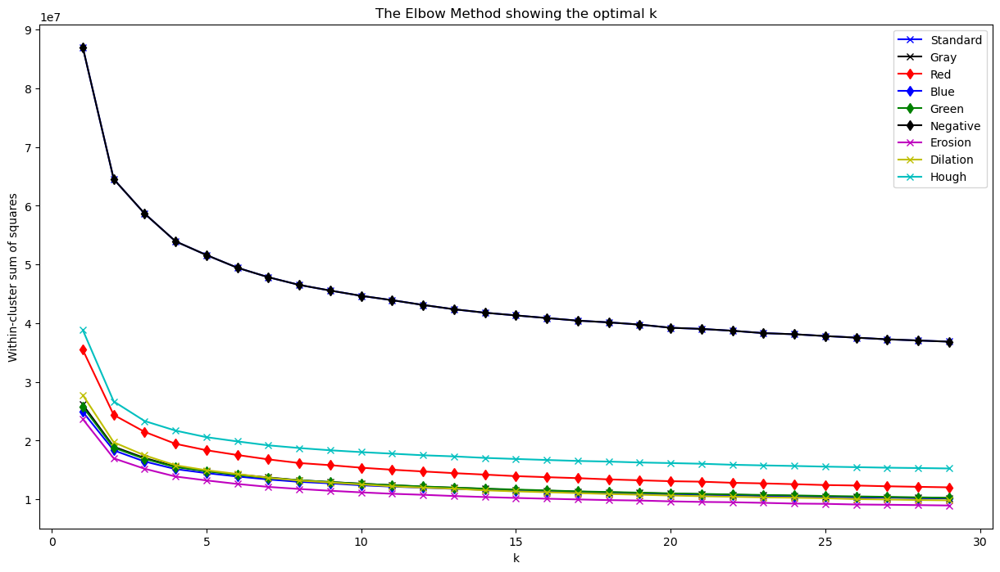

In [42]:
plt.figure(figsize=(15, 8))
plt.plot(results[0], results[1], 'bx-', label = 'Standard')
plt.plot(results_gray[0], results_gray[1], 'kx-', label = 'Gray')
plt.plot(results_red[0], results_red[1], 'rd-', label = 'Red')
plt.plot(results_gray[0], results_blue[1], 'bd-', label = 'Blue')
plt.plot(results_gray[0], results_green[1], 'gd-', label = 'Green')
plt.plot(results_gray[0], results_negative[1], 'kd-', label = 'Negative')
plt.plot(results_gray[0], results_erosion[1], 'mx-', label = 'Erosion')
plt.plot(results_gray[0], results_dilatation[1], 'yx-', label = 'Dilation')
plt.plot(results_gray[0], results_hough[1], 'cx-', label = 'Hough')

plt.xlabel('k')
plt.ylabel('Within-cluster sum of squares')
plt.title('The Elbow Method showing the optimal k')
plt.legend()
plt.show()

A teraz bez standard i negative.

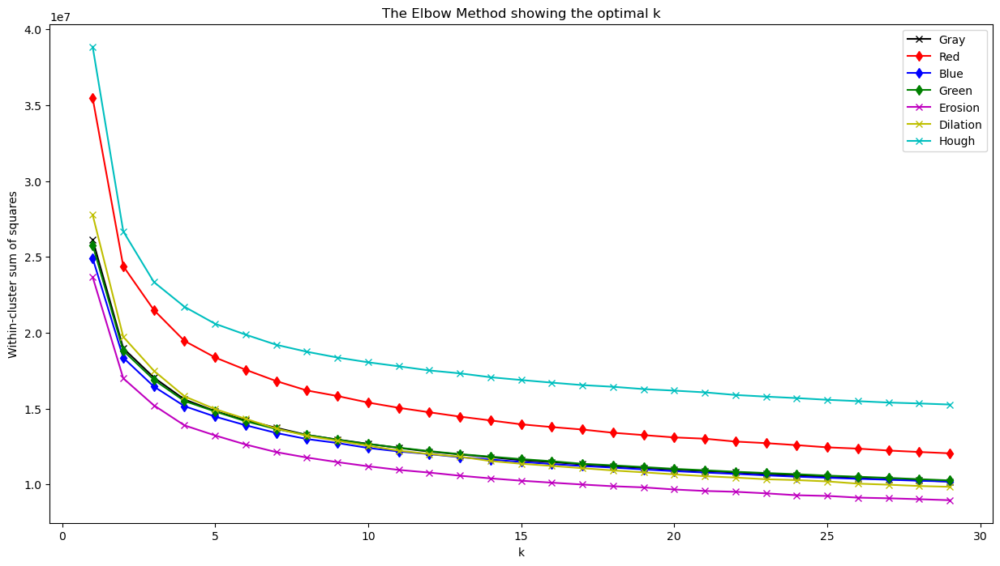

In [46]:
plt.figure(figsize=(15, 8))
plt.plot(results_gray[0], results_gray[1], 'kx-', label = 'Gray')
plt.plot(results_red[0], results_red[1], 'rd-', label = 'Red')
plt.plot(results_gray[0], results_blue[1], 'bd-', label = 'Blue')
plt.plot(results_gray[0], results_green[1], 'gd-', label = 'Green')
plt.plot(results_gray[0], results_erosion[1], 'mx-', label = 'Erosion')
plt.plot(results_gray[0], results_dilatation[1], 'yx-', label = 'Dilation')
plt.plot(results_gray[0], results_hough[1], 'cx-', label = 'Hough')

plt.xlabel('k')
plt.ylabel('Within-cluster sum of squares')
plt.title('The Elbow Method showing the optimal k')
plt.legend()
plt.show()

### 9.4.2. Silhouette score

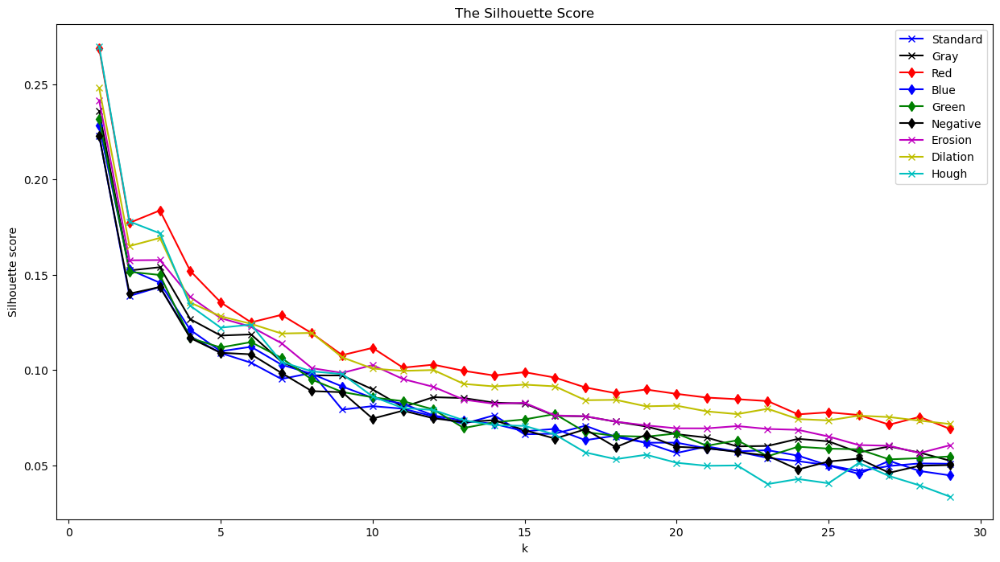

In [47]:
plt.figure(figsize=(15, 8))
plt.plot(results[0], results[2], 'bx-', label = 'Standard')
plt.plot(results_gray[0], results_gray[2], 'kx-', label = 'Gray')
plt.plot(results_red[0], results_red[2], 'rd-', label = 'Red')
plt.plot(results_gray[0], results_blue[2], 'bd-', label = 'Blue')
plt.plot(results_gray[0], results_green[2], 'gd-', label = 'Green')
plt.plot(results_gray[0], results_negative[2], 'kd-', label = 'Negative')
plt.plot(results_gray[0], results_erosion[2], 'mx-', label = 'Erosion')
plt.plot(results_gray[0], results_dilatation[2], 'yx-', label = 'Dilation')
plt.plot(results_gray[0], results_hough[2], 'cx-', label = 'Hough')

plt.xlabel('k')
plt.ylabel('Silhouette score')
plt.title('The Silhouette Score')
plt.legend()
plt.show()

### 9.4.3. Indeks Dunna

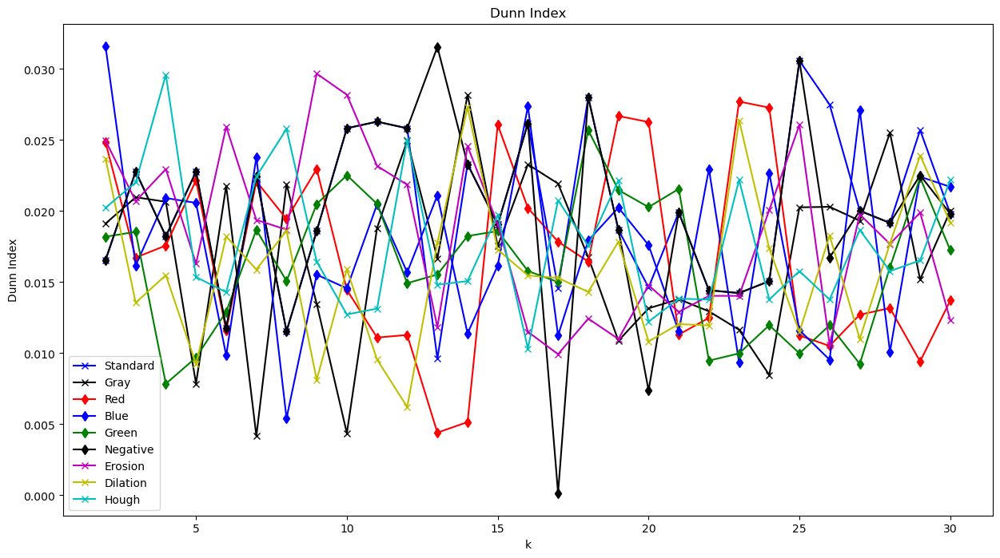

In [51]:
plt.figure(figsize=(15, 8))
plt.plot(range(1,31), results[3], 'bx-', label = 'Standard')
plt.plot(range(1,31), results_gray[3], 'kx-', label = 'Gray')
plt.plot(range(1,31), results_red[3], 'rd-', label = 'Red')
plt.plot(range(1,31), results_blue[3], 'bd-', label = 'Blue')
plt.plot(range(1,31), results_green[3], 'gd-', label = 'Green')
plt.plot(range(1,31), results_negative[3], 'kd-', label = 'Negative')
plt.plot(range(1,31), results_erosion[3], 'mx-', label = 'Erosion')
plt.plot(range(1,31), results_dilatation[3], 'yx-', label = 'Dilation')
plt.plot(range(1,31), results_hough[3], 'cx-', label = 'Hough')

plt.xlabel('k')
plt.ylabel('Dunn Index')
plt.title('Dunn Index')
plt.legend()
plt.show()

Dużo nam to nie da...

### 9.4.4. Indeks Davies-Bouldina

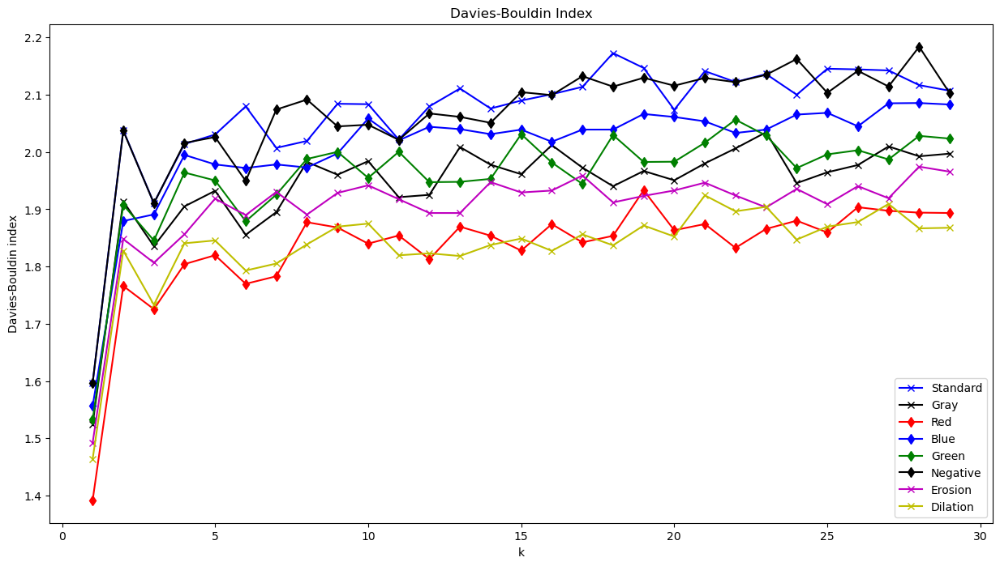

In [53]:
plt.figure(figsize=(15, 8))
plt.plot(results[0], results[4], 'bx-', label = 'Standard')
plt.plot(results_gray[0], results_gray[4], 'kx-', label = 'Gray')
plt.plot(results_red[0], results_red[4], 'rd-', label = 'Red')
plt.plot(results_gray[0], results_blue[4], 'bd-', label = 'Blue')
plt.plot(results_gray[0], results_green[4], 'gd-', label = 'Green')
plt.plot(results_gray[0], results_negative[4], 'kd-', label = 'Negative')
plt.plot(results_gray[0], results_erosion[4], 'mx-', label = 'Erosion')
plt.plot(results_gray[0], results_dilatation[4], 'yx-', label = 'Dilation')

plt.xlabel('k')
plt.ylabel('Davies-Bouldin index')
plt.title('Davies-Bouldin Index')
plt.legend()
plt.show()

### 9.4.5. Indeks Calinskiego-Harabasza

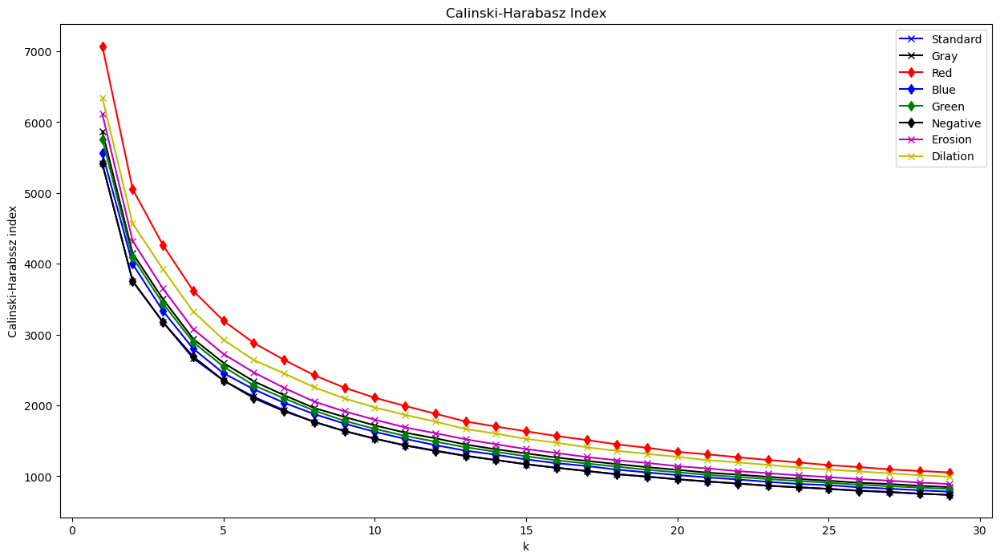

In [54]:
plt.figure(figsize=(15, 8))
plt.plot(results[0], results[5], 'bx-', label = 'Standard')
plt.plot(results_gray[0], results_gray[5], 'kx-', label = 'Gray')
plt.plot(results_red[0], results_red[5], 'rd-', label = 'Red')
plt.plot(results_gray[0], results_blue[5], 'bd-', label = 'Blue')
plt.plot(results_gray[0], results_green[5], 'gd-', label = 'Green')
plt.plot(results_gray[0], results_negative[5], 'kd-', label = 'Negative')
plt.plot(results_gray[0], results_erosion[5], 'mx-', label = 'Erosion')
plt.plot(results_gray[0], results_dilatation[5], 'yx-', label = 'Dilation')

plt.xlabel('k')
plt.ylabel('Calinski-Harabssz index')
plt.title('Calinski-Harabasz Index')
plt.legend()
plt.show()

## 10. TSNE
Wizualizacja klasteryzacji.

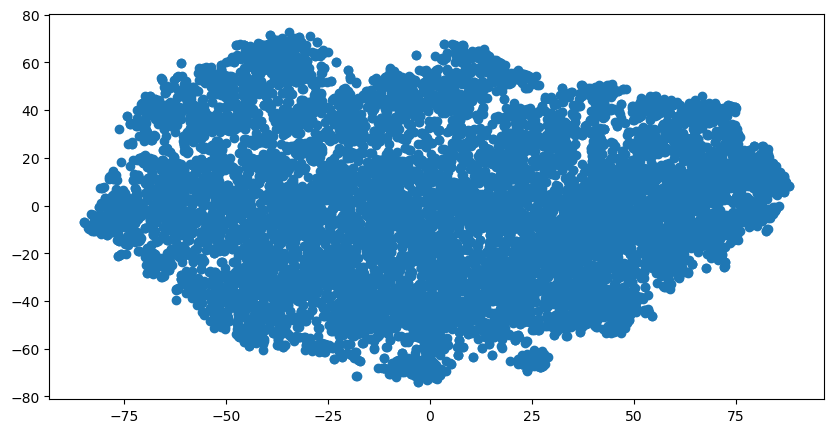

In [33]:
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(X_train_pca)
plt.figure(figsize=(10, 5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])